<a href="https://colab.research.google.com/github/gtzan/mir_book/blob/master/Explaining_the_DFT_a_music_perspective.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A music and sound exposition of the Discrete Fourier Transform
# George Tzanetakis - Department of Computer Science, University of Victoria

The Discrete Fourier Transform (DFT) is fundamental for any type of music and sound processing using computers. The goal of this notebook is to develop high-level intuition behind the concepts that underlie the DFT and understand how this transformation is used by various algorithms for audio analysis and synthesis. The intended audience is anyone with some knowledge of high school math that is interested in the topic. This is not a detailed mathematical digital signal processing (DSP) exposition. At the end of the notebook a variety of resources for better understanding the DFT and audio processing are provided for further digging.

There are many great resources for understanding the DFT including textbooks, tutorial articles, and videos some of which are listed at the end of this exposition. This material reflects my own personal way of teaching the DFT that has evolved over twenty years of experience with striving to explain the underlying concepts to students from diverse academic backgrounds and disciplines with a focus on how it connects to music information retrieval.



## Sinusoids as mathematical abstractions for understanding sound

A sinusoid is a type of continuous curve with a specific repeating shape. It is a mathematical abstraction that can help us reason about a variety of real-world phenomena. It is an idealization similarly to how a circle or an infinite line are mathematical abstractions that can help us solve concrete problems in physical gemotry. Real-word signals don't last forever and in many cases are discrete in nature. For example audio signals are changes in air pressure created by disturbing a large but finite number of air molecules and have a finite duration. It is important to keep in mind that sinusoidal signals are conceptual abstractions as this will inform us about both the advantages of using them as well as their limitations when modeling actual audio signals.

The equation for a continuous sinusoid is:
$$
f(t) = \alpha sin(\omega t + \phi)\;\;\;\; \text{with} \;\;\;   -\infty < t < +\infty
$$

It is a function of a continuous variable $t$ representing time. Each sinusoid is uniquely characterized by three numbers: the amplitude $\alpha$, the frequency $\omega$, and the phase $\phi$. The notation can change but it is important to keep in mind for the rest of the exposition that each sinusoidal signal is characterized uniquely by these three numbers.

## Sampling and Quantization

Our goal is to process audio signals using computers. Computers need to operate on discrete numerical values that are represented by a finite number of bits. Sampling refers to the process of taking measurements of the signal under consideration at discrete regular time intervals (for example we can sample/measure the temperature of a lake every 1 hour). For each time instance we have a corrsesponding measurement of the value of the signal. This measurement needs to be represented using a set of discrete values represented using a finite number of bits. As an example, a compact disc stores digital audio samples at a sampling rate of 44100 samples/second and each sample is represented as an 16-bit integer. For the remaining of the notebook, we will be working with audio signals with values represented as floating point numbers between -1.0 and 1.0 as this make audio processing easier. We will also be showing plots that look as if the underlying signal is continuous so it is useful to keep in mind that the actual representation is discrete arrays of audio samples as shown in the plot of the sinusoids with stems on each value shown below.



## Playing and plotting a sinusoid signal

So after sampling and quantization we represent sounds as very large array of floating point numbers between -1.0 and 1.0. We can generate some samples (corresponding to a specific duration) of a sinusoid of a particular frequency and then see the corresponding plot. In the example below I use a very low sampling rate (compared to audio sampling rates) so that we can show with plots the difference between the continuous curve plotting that we will be using and contrast it with the more accurate stem plot that shows each individual audio sample.

In [1]:

import numpy as np
import IPython.display as ipd
import librosa
%matplotlib inline
import matplotlib.pyplot as plt

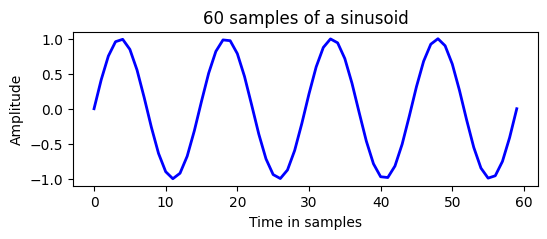

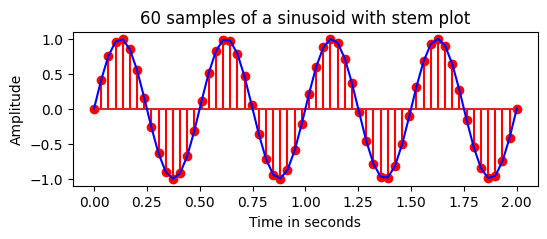

In [2]:
srate = 30         # sampling rate 30 samples a second
duration = 2       # duration in seconds
freq = 2           # frequency

t = np.linspace(0,duration,srate*duration)     # time instances of samples
data =  np.sin(2*np.pi*freq*t);                # audio samples

fig = plt.figure(figsize=(6,2))
plt.xlabel("Time in samples")
plt.ylabel("Amplitude")
plt.title("60 samples of a sinusoid")
plt.plot(data[0:120], lw=2, color='blue')
fig = plt.figure(figsize=(6,2))
plt.xlabel("Time in seconds")
plt.ylabel("Amplitude")
plt.title("60 samples of a sinusoid with stem plot")
plt.stem(t[0:120],data[0:120], 'r', )
plt.plot(t[0:120], data[0:120], color='blue')
plt.show()




Now let's create a sinusoidal sound of a specific duration with more realistic parameters for sampling rate, frequency, and duration that we can actuallty hear.

In [3]:
srate = 22050      # sampling rate
duration = 2       # duration in seconds
freq = 440         # frequency in herz

t = np.linspace(0,duration,srate*duration)     # time instances of samples
data =  np.sin(2*np.pi*freq*t);                # audio samples

# play the corresponding audio
ipd.Audio(data,rate=srate, normalize=False)

In [4]:
# Let's use the code above to create a functions that will return an array of
# time points and the corresponding samples

def create_sinusoid(amp = 1.0, freq = 440.0, phase=0.0, dur = 1.0, srate =srate):
  t = np.linspace(0,dur, int(srate* dur))
  data = amp * np.sin(2*np.pi*freq*t+phase)
  return (t,data)

(t,audio) = create_sinusoid(amp=1.0, freq=220.0, phase=0.0, dur=2.0)
ipd.Audio(audio, rate=srate, normalize=False)


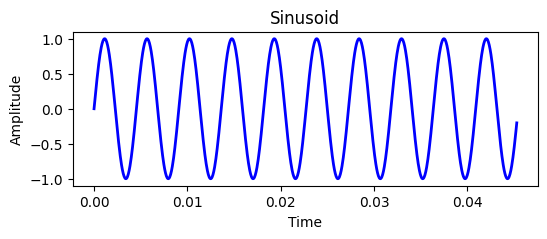

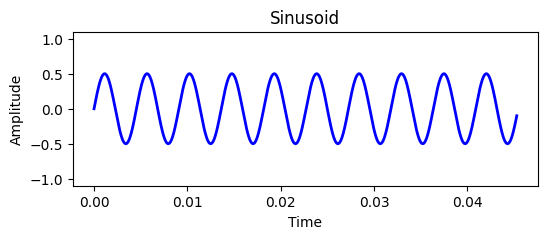

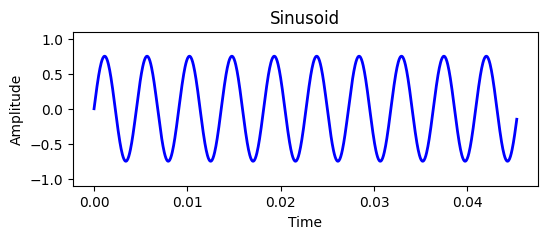

In [5]:
def plot_samples(t, data, start_samples = 0, end_samples = 1000, xlabel="Time", ylabel="Amplitude", title="Sinusoid"):
  fig = plt.figure(figsize=(6,2))
  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.title(title)
  plt.ylim(-1.1, 1.1) #

  plt.plot(t[start_samples:end_samples], data[start_samples:end_samples], lw=2, color='blue')
  plt.show()

# create a sinusoid with a different amplitude
(t,audio2) = create_sinusoid(amp=0.5, freq=220.0, dur=2.0, phase=0.0)
(t,audio3) = create_sinusoid(amp = 0.75, freq=220)
plot_samples(t, audio)
plot_samples(t, audio2)
plot_samples(t,audio3)

## Playing a simple melody using sinusoids

We can use sinusoids with appropriately defined frequencies and durations to play simple recognizable melodies.

In [6]:
# frequencies of three notes (C, D, E)
c_freq = 523.0
d_freq = 587.0
e_freq = 659.0

# generate sine signals corresponding to each note
c_data = create_sinusoid(freq = c_freq, dur = 0.5, amp = 0.5, srate = srate)
d_data = create_sinusoid(freq = d_freq, dur = 0.5, amp = 0.5)
e_data = create_sinusoid(freq = e_freq, dur = 0.5, amp = 0.5)

# form a simple melody by concateneting the signal arrays for each note
data = np.hstack([c_data, d_data, e_data, c_data, c_data, d_data, e_data, c_data])
ipd.Audio(data,rate=srate)

## Adding sinusoidal signals

Sinusoidal signals can be added together. The resulting signal is also infinite and periodic but will have a different shape. Let's listen and plot some linear combinations of sinusoids. This is called additive synthesis



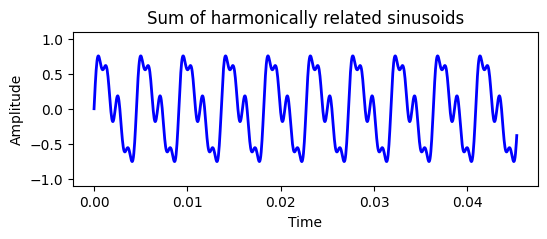

In [7]:
(t,s1) = create_sinusoid(amp = 0.6, freq = 220.0, dur = 1.0, phase = 0)
(t,s2) = create_sinusoid(amp = 0.3, freq = 440.0, dur = 1.0, phase = 0)
(t,s3) = create_sinusoid(amp = 0.2, freq = 880.0, dur = 1.0, phase = 0)

s = np.concatenate([s1+s2+s3, s1+s2, s1], axis=0)
plot_samples(t,s, title="Sum of harmonically related sinusoids")
ipd.Audio(s, rate=srate)

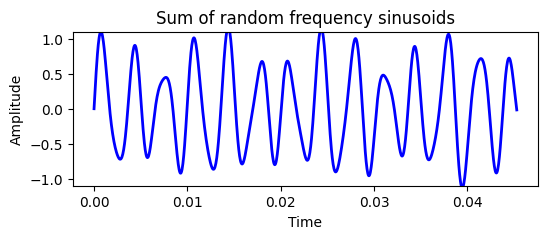

In [8]:
(t,s1) = create_sinusoid(amp = 0.2, freq = 220.0, dur = 2.0, phase = 0)
(t,s2) = create_sinusoid(amp = 0.8, freq = 297.0, dur = 2.0, phase = 0)
(t,s3) = create_sinusoid(amp = 0.2, freq = 503.0, dur = 2.0, phase = 0)

s = np.concatenate([s1+s2+s3, s1+s2, s1], axis=0)
plot_samples(t,s, title="Sum of random frequency sinusoids")
ipd.Audio(s, rate=srate)

So as a first observation we notice that we can get more complex sounds by adding sinusoids and when the corresponding frequencies are integer multiples of each other the resulting sound is less dissonant. Informally we have seen that we can create simple melodies by appropriately playing sinusoids at particular frequencies and durations and that we can create more complex sounds by adding together sinusoids of different frequencies. The resulting complex sounds can be quite fascinating:

[THX Logo in Python](https://musicinformationretrieval.com/content/11_fun/thx_logo_theme.html
)

Given these observations for analysis of music signals we would like to be able to take a melody or complex sound and figure out what are the corresponding frequencies, amplitudes, and phases of the sinusoidal signals that comprise it. If we can figure out a way to do this it will give us a lot of insights about music audio signals.


We will start by considering a simplified version of the analysis problem. Our first task will be to determine the amplitude of a sinusoid signal. An obvious way to do so is to consider the maximum value of the signal. If we have a few cycles of a sinusoidal signal this should work. Let's check it out.


Peak amplitude = 0.50 
Peak amplitude = 2.75 


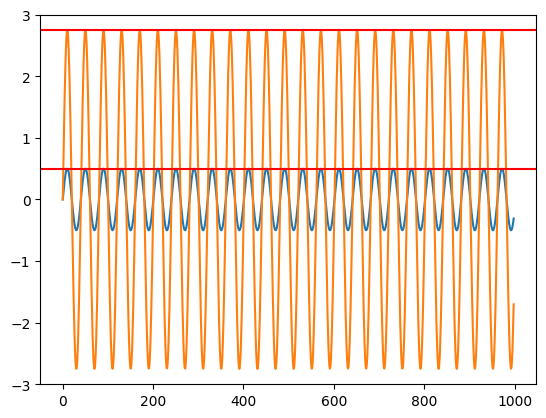

In [9]:
def peak_amplitude(data):
    return np.max(data)

freq = 550
(t,audio1) = create_sinusoid(amp = 0.5, freq=freq, dur=3)
print('Peak amplitude = %2.2f ' % peak_amplitude(audio1))
(t,audio2) = create_sinusoid(amp = 2.75, freq=freq, dur=3)
print('Peak amplitude = %2.2f ' % peak_amplitude(audio2))

# We see how this works visually

plt.figure()
plt.ylim((-3, 3))

plt.plot(audio1[0:999])
plt.plot(audio2[0:999])
plt.axhline(y=peak_amplitude(audio1), color='r', linestyle='-')
plt.axhline(y=peak_amplitude(audio2), color='r', linestyle='-')


We now have a way of measuring the amplitude of sinusoidal signal from an array of digital samples. In more realistic situations when analyzing music and sounds there will not be a single sinusoidal signal but rather combinations of them and interferring noise and sounds.
Let's look at what happens when we use the peak amplitude estimation method when some noise is added to our input.


Peak amplitude = 4.81 


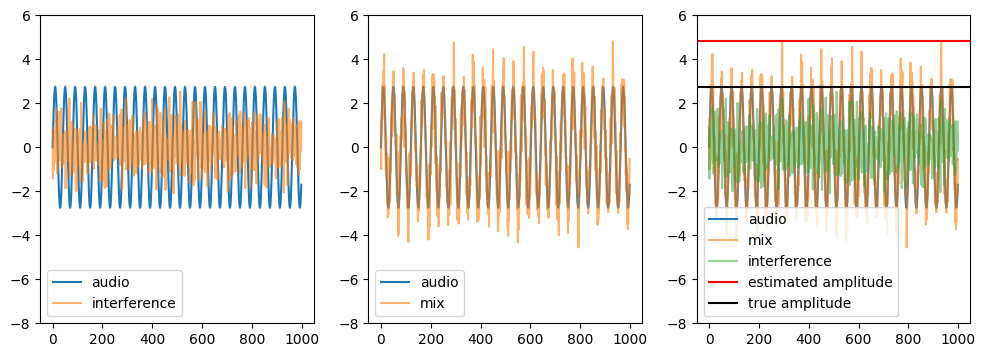

In [10]:
noise = np.random.normal(0, 0.75, len(audio1))
mix = audio2 + noise

print('Peak amplitude = %2.2f ' % peak_amplitude(mix[0:999]))


def mix_plot(audio, interference, mix, amplitude_function):
  plt.rcParams["figure.figsize"] = (12,4)
  fig, (ax1, ax2, ax3) = plt.subplots(1,3)
  ax1.set_ylim((-8, 6))
  ax1.plot(audio, label='audio')
  ax1.plot(interference, label = 'interference', alpha=0.6)
  ax1.legend(loc='lower left')

  ax2.set_ylim((-8,6))
  ax2.plot(audio, label='audio')
  ax2.plot(mix, label = 'mix', alpha=0.6)
  ax2.legend(loc='lower left')

  ax3.set_ylim((-8,6))
  ax3.plot(audio, label='audio')
  ax3.plot(mix, label = 'mix', alpha=0.6)
  ax3.plot(interference, alpha = 0.5, label='interference')
  ax3.axhline(y=amplitude_function(mix), color='r', linestyle='-', label='estimated amplitude')
  ax3.axhline(y=amplitude_function(audio), color='black', linestyle='-', label='true amplitude')
  ax3.legend(loc='lower left')

mix_plot(audio2[0:999], noise[0:999], mix[0:999], peak_amplitude)
ipd.Audio(mix, rate=srate)

So the peak amplitude estimation seems quite sensitive to the interferring noise. Intuititively this makes sense as there we consider only one sample of the array to perform the estimation. A more robust way would be to consider each sample of the arrray for the amplitude estimation. A common approach used in DSP is to perform RMS (Root Mean Squarred) amplitude estimation. The equation for RMS is:

$$
RMS = \sqrt{\frac{1}{N}\sum_{n=0}^{N-1} x[n]^2}
$$

For the mathematically inclined you can show why in the code below there is a square root of 2 factor in the RMS amplitude estimation of a sinusoid. To do so substitute $x[n]$ with $A \sin(\omega t)$ and then take the integral corresponding to the sum in the continuous case.

RMS amplitude = 2.75 
RMS amplitude = 2.91 


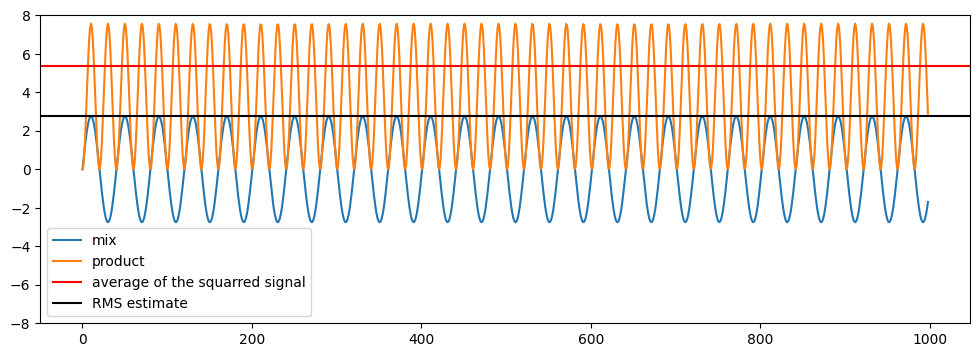

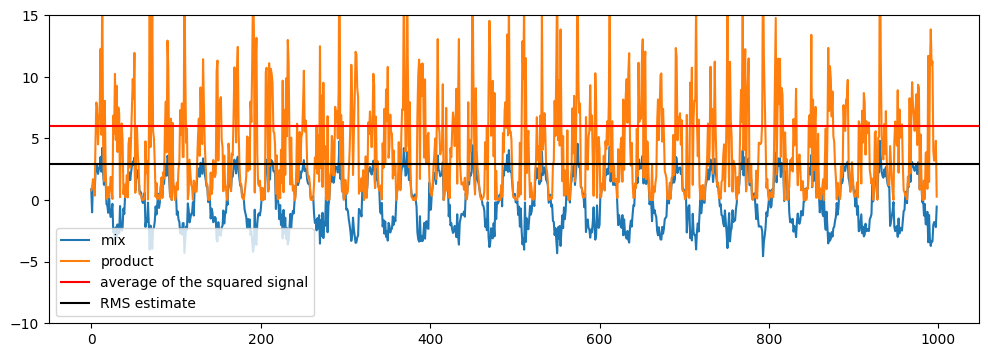

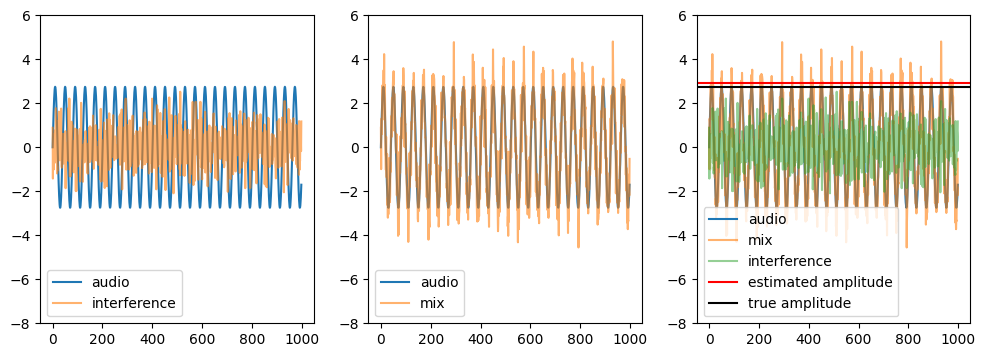

In [11]:
def rms_amplitude(data):
    rms_sum = np.sum(np.multiply(data,data))
    rms_sum /= len(data)
    return np.sqrt(rms_sum) * np.sqrt(2.0)


print('RMS amplitude = %2.2f ' % rms_amplitude(audio2[0:999]))
print('RMS amplitude = %2.2f ' % rms_amplitude(mix[0:999]))

audio_product = np.multiply(audio2[0:999],audio2[0:999])
plt.figure()
plt.ylim((-8, 8))
plt.plot(audio2[0:999], label = 'mix')
plt.plot(audio_product, label='product')
plt.axhline(y=np.mean(audio_product) * np.sqrt(2.0), color='r', linestyle='-', label='average of the squarred signal')
plt.axhline(y=np.sqrt(np.mean(audio_product)) * np.sqrt(2.0), color='black', linestyle='-', label='RMS estimate')
plt.legend(loc='lower left')

audio_product = np.multiply(mix[0:999],mix[0:999])
plt.figure()
plt.ylim((-10, 15))
plt.plot(mix[0:999], label = 'mix')
plt.plot(audio_product, label='product')
plt.axhline(y=np.mean(audio_product) * np.sqrt(2.0), color='r', linestyle='-', label='average of the squared signal')
plt.axhline(y=np.sqrt(np.mean(audio_product)) * np.sqrt(2.0), color='black', linestyle='-', label='RMS estimate')
plt.legend(loc='lower left')


mix_plot(audio2[0:999], noise[0:999], mix[0:999], rms_amplitude)


So RMS amplitude estimation is more robust to interference than peak amplitude estimation but starts not working well when the amplitude of the interferring noise is larger as you can observe below.  

RMS amplitude = 2.75 
RMS amplitude = 3.49 


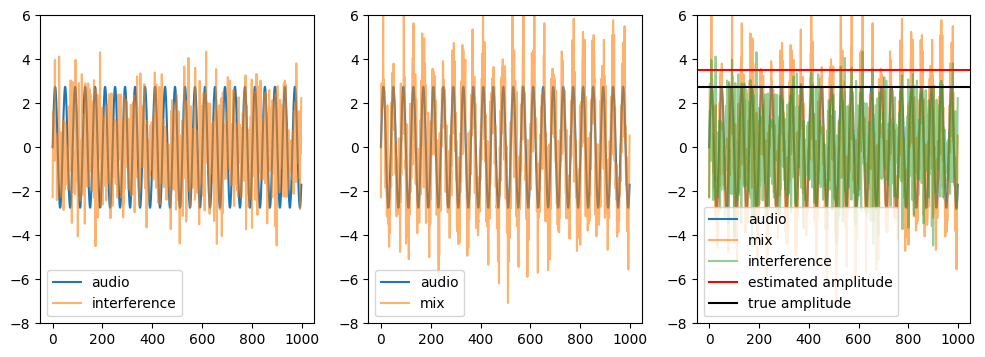

In [12]:
noise = np.random.normal(0, 1.5, len(audio1))
mix = audio2 + noise

print('RMS amplitude = %2.2f ' % rms_amplitude(audio2[0:999]))
print('RMS amplitude = %2.2f ' % rms_amplitude(mix[0:999]))

mix_plot(audio2[0:999], noise[0:999], mix[0:999], rms_amplitude)


ipd.Audio(mix, rate=srate)

To deal more robustly with interference we will have to make an additional assumption to perform amplitude estimation of sinusoidal signal. The additional assumption will be that we know the frequency of the sinusoidal signal that we are trying to estimate the amplitude.
By knowing the frequency we can reliably estimate the amplitude in much more challenging conditions. To do so we will be utilizing the dot product between two signals/arrays which is defined as:

$$
<x,y> = \sum_{n=0}^{N-1} x[n] * y[n]
$$

Knowing the frequency we are trying to estimate the amplitude for we can create a "probe" sinusoids of the same frequency and unit amplitude. Taking the dot product of our input signal, potentially having other interferring sounds will allow us to robustly estimate the amplitude of that sinusoids. **Important note:** this works only if both the sinusoids that is burried with other sounds and the "probe" sinusoids have the same phase. Later on we will use the term "basis" for this "probe" sinusoid of unit amplitude and matching phase.

Dot amplitude = 2.75 
Dot amplitude = 2.76 


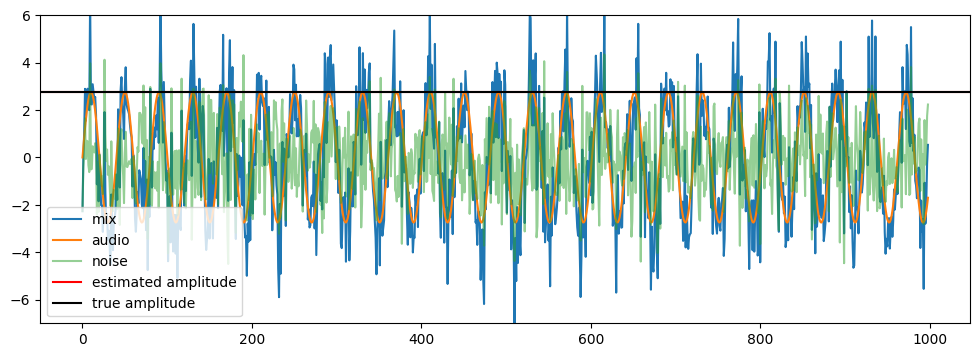

In [13]:
def dot_amplitude(audio, freq):
    dur = audio.shape[0] / srate
    # create the probe/basis sinusoid for the right frequency
    (t,basis) = create_sinusoid(freq=freq, dur=dur, amp = 1)
    dot_product = np.dot(audio, basis)
    return 2 * (dot_product / len(audio))

print('Dot amplitude = %2.2f ' % dot_amplitude(audio2, freq))
print('Dot amplitude = %2.2f ' % dot_amplitude(mix, freq))


plt.figure()
plt.ylim((-7, 6))
plt.plot(mix[0:999], label = 'mix')
plt.plot(audio2[0:999], label='audio')
plt.plot(noise[0:999], alpha = 0.5, label='noise')
plt.axhline(y=dot_amplitude(mix[0:999], freq), color='r', linestyle='-', label='estimated amplitude')
plt.axhline(y=dot_amplitude(audio2[0:999], freq), color='black', linestyle='-', label='true amplitude')
plt.legend(loc='lower left')


Let's try to see visually how this dot-product amplitude estimation works. The orange plot is the multiplication of the input signal with the probe signal. The average of the point-wise multiplication result is the red line. In this case it corresponds to half the amplitude so we scale by 2 to get the dot-product amplitude estimation.

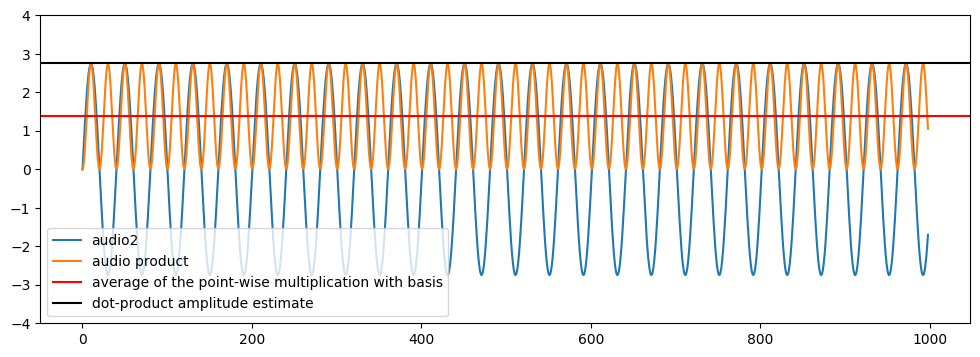

In [14]:
dur = audio2.shape[0] / srate
(t,basis) = create_sinusoid(freq=freq, dur=dur, amp = 1)

audio_product = np.multiply(audio2[0:999],basis[0:999])
plt.figure()
plt.ylim((-4, 4))
plt.plot(audio2[0:999], label = 'audio2')
plt.plot(audio_product, label='audio product')
plt.axhline(y=np.mean(audio_product), color='r', linestyle='-', label='average of the point-wise multiplication with basis')
plt.axhline(y=2 * np.mean(audio_product), color='black', linestyle='-', label='dot-product amplitude estimate')
plt.legend(loc='lower left')

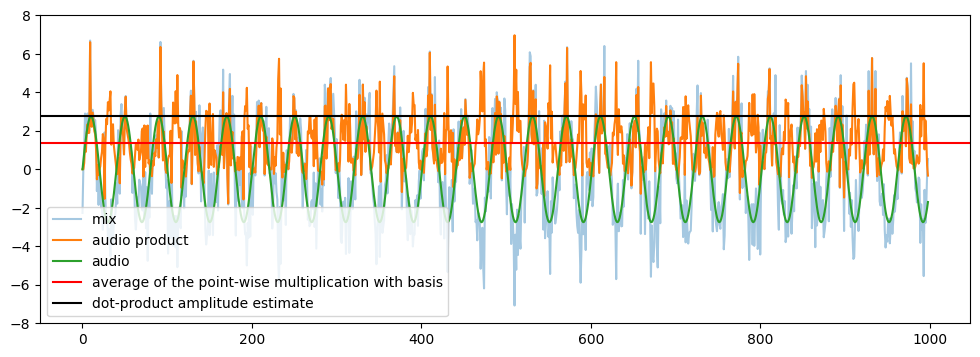

In [15]:
dur = audio2.shape[0] / srate
(t,basis) = create_sinusoid(freq=freq, dur=dur, amp = 1)

audio_product = np.multiply(mix[0:999],basis[0:999])
plt.figure()
plt.ylim((-8, 8))
plt.plot(mix[0:999], label = 'mix', alpha=0.4)
plt.plot(audio_product, label='audio product')
plt.plot(audio2[0:999], label = 'audio')

plt.axhline(y=np.mean(audio_product), color='r', linestyle='-', label='average of the point-wise multiplication with basis')
plt.axhline(y=2 * np.mean(audio_product), color='black', linestyle='-', label='dot-product amplitude estimate')
plt.legend(loc='lower left')

Now let's consider some other interference scenarios in addition to noise with music recordings.


In [16]:
filename = librosa.ex('trumpet')
trumpet, sr = librosa.load(filename)
trumpet = 16.0 * trumpet[0:audio2.shape[0]]
print(trumpet.shape)
print(audio2.shape)
mix = audio2 + trumpet
ipd.Audio(mix, rate=srate)

(66150,)
(66150,)


In [17]:
filename = librosa.ex('fishin')
fishin, sr = librosa.load(filename)
ipd.Audio(fishin, rate=sr)

Dot amplitude = 2.75 
Dot amplitude = 2.75 


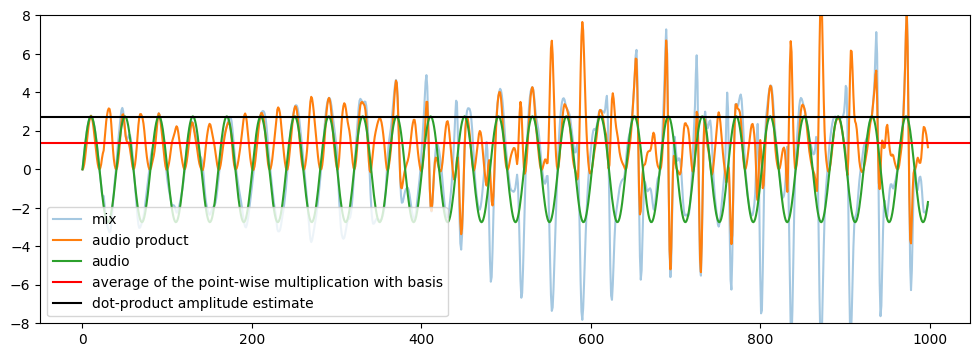

In [18]:
print('Dot amplitude = %2.2f ' % dot_amplitude(audio2, freq))
print('Dot amplitude = %2.2f ' % dot_amplitude(mix, freq))
dur = audio2.shape[0] / srate
(t,basis) = create_sinusoid(freq=freq, dur=dur, amp = 1)

audio_product = np.multiply(mix[0:999],basis[0:999])
plt.figure()
plt.ylim((-8, 8))
plt.plot(mix[0:999], label = 'mix', alpha=0.4)
plt.plot(audio_product, label='audio product')
plt.plot(audio2[0:999], label = 'audio')

plt.axhline(y=np.mean(audio_product), color='r', linestyle='-', label='average of the point-wise multiplication with basis')
plt.axhline(y=2 * np.mean(audio_product), color='black', linestyle='-', label='dot-product amplitude estimate')
plt.legend(loc='lower left')

**Exercise for the reader** - experiment with the dot-product estimation with the input being a simple additive combination of sinusoidal signals. Generate
a sound consisting of three sinusoids with harmonically-related frequencies
and random amplitudes. Use three "probe" sinusoids with the same frequencies and unit amplitude to estimate the random amplitudes from the mixture sound.
The creation of a sound from adding harmonically related sinusoids is called additive synthesis.


# Dealing with time

So far we have discussed amplitude estimation using the dot-product approach of looking for a specific frequency in our mixture of sounds signal. What if we have as input a signal that changes over time (for example a simple melody played by sinusoidal oscillators) ?

# Dealing with phase

So far we have assumed that the unit amplitude basis sinusoidal signal that we use for the dot-product amplitude estimation is in phase with the sinusoidal signal for which we are trying to estimate the amplitude. Let's see what can happen if that assumption does not hold i.e the basis and the original sinusoidal signal have the same frequency but different phases.



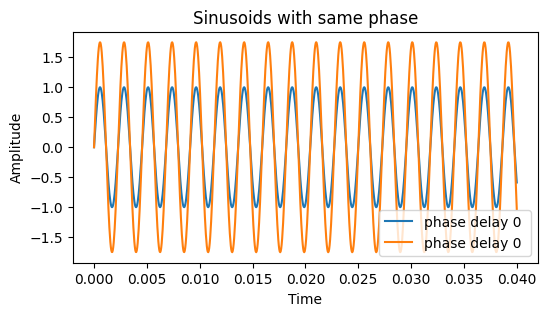

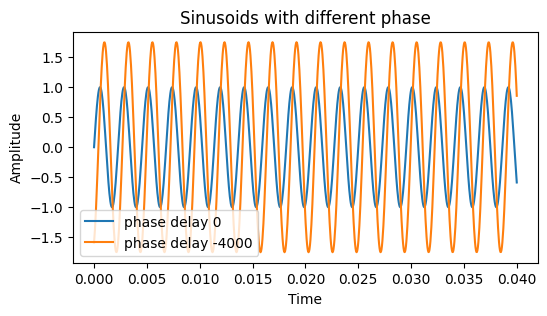

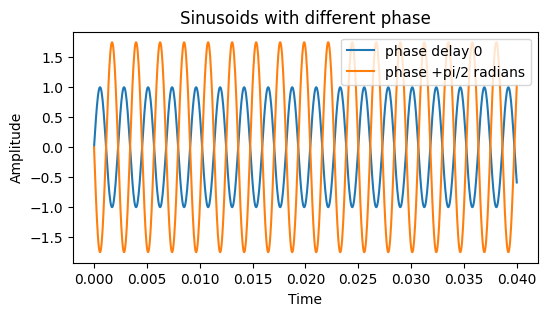

In [24]:

(t,probe) = create_sinusoid(freq = 440, dur = 0.04,amp = 1.0, phase = 0.0)
(t,data1) = create_sinusoid(freq = 440, dur = 0.04,amp = 1.75, phase = 0.0)
(t,data2) = create_sinusoid(freq = 440, dur = 0.04,amp = 1.75, phase = -4000 * (2 * np.pi / srate))
(t,data3) = create_sinusoid(freq = 440, dur = 0.04,amp = 1.75, phase = np.pi)

fig = plt.figure(figsize=(6,3))
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Sinusoids with same phase')
plt.plot(t, probe, t, data1)
plt.legend(['phase delay 0 ', 'phase delay 0'])
plt.show()

fig = plt.figure(figsize=(6,3))
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Sinusoids with different phase')
plt.plot(t, probe, t, data2)
plt.legend(['phase delay 0 ', 'phase delay -4000'])
plt.show()

fig = plt.figure(figsize=(6,3))
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Sinusoids with different phase')
plt.plot(t, probe, t, data3)
plt.legend(['phase delay 0 ', 'phase +pi/2 radians'])
plt.show()

As you can see if the sinusoid for which we are trying to estimate the amplitude does not have the same phase as the basis unit amplitude probe sinusoid then the amplitude estimation does not work. Visually you can understand this by looking at the plots and realizing that only when the two sinusoids are aligned in terms of phase they correlate appropriately to perform the amplitude estimation. Let's see if that's the case.


In [26]:

def amplitude_estimate(data1, data2):
    mdata = np.multiply(data1,data2)
    return (2 * np.sum(mdata)/len(mdata))

print(amplitude_estimate(probe, data1))
print(amplitude_estimate(probe, data2))
print(amplitude_estimate(probe, data3))


1.7412241565660342
0.7216382461773139
-1.741224156566034


So now we have a robust way of estimating the amplitude of a sinusoid of a given frequency but it requires phase alignment. One idea that actually does work is to try different phase shifts and select the one that provides the highest/best amplitude estimation. Once we find the "best" shift we can adjust basis with unit amplitude to align with the complex sound and thus get the right amplitude estimation. However, this approach comes with a high-cost. The operation of sliding the inner-products by different shifts is called a cross-correlation is costly to perform for many shifts. Using some math we will see we can avoid this tedious brute-force approach and perform reliable amplitude estimation using only two inner products.


Tangent: Dichotic pitch, create stimulus, cross-correlation, delay and multiply/sum


Estimated shift for data2 =  54
Estimated shift for data3 =  2007
Estimated shift for data4 =  -944


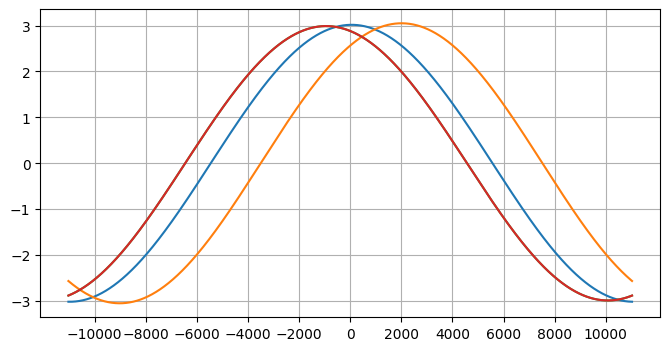

Amplitude estimate when aligned with basis = 3.0151762461331812
Amplitude estimate without alignment = 3.0151762461331812
2.5638381040133504
Amplitude estimate with alignment = 3.0151762461331812
3.0487819310917823


In [27]:

def plot_amp_phases(data1, srate):
    amplitude_estimates = np.zeros(srate)
    shifts = np.arange(-int(srate/2), int(srate/2))
    # calculate the amplitude_estimate for different integer shifts (delays)
    for k in shifts:
        (t,data2) = create_sinusoid(freq=440, dur = 0.02,amp = 1.0, phase = k * (2 * np.pi / srate))
        amplitude_estimates[k+int(srate/2)] = amplitude_estimate(data1,data2)
    plt.plot(shifts, amplitude_estimates)
    # return the location of the highest peak as an estimate of the appropriate shift
    return shifts[np.argmax(amplitude_estimates)]


srate = 22050
fig = plt.figure(figsize=(8,4))

k = 0
(t,data1) = create_sinusoid(freq=440, dur = 0.02,amp = 1.0, phase = 0)
(t,data2) = create_sinusoid(freq=440, dur = 0.02,amp = 3.0, phase = 0)
shift_data2 = plot_amp_phases(data2, srate)
print('Estimated shift for data2 = ', shift_data2)


(t,data3) = create_sinusoid(freq=440, dur = 0.02,amp = 3.0, phase = 2000 * (2 * np.pi / srate))
shift_data3 = plot_amp_phases(data3, srate)
print('Estimated shift for data3 = ', shift_data3)


(t,data4) = create_sinusoid(freq=440, dur = 0.02,amp = 3.0, phase = -1000 * (2 * np.pi / srate))
shift_data4 = plot_amp_phases(data4, srate)
print('Estimated shift for data4 = ', shift_data4)

plot_amp_phases(data4, srate)
plt.xticks(np.arange(-10000, 11000, 2000))
plt.grid()
plt.show()


print('Amplitude estimate when aligned with basis =', amplitude_estimate(data1, data2))

(t,data1_shifted) = create_sinusoid(freq=440, dur = 0.02,amp = 1.0,phase = shift_data3 * (2 * np.pi / srate))
print('Amplitude estimate without alignment =', amplitude_estimate(data1, data2))
print(amplitude_estimate(data1, data3))
print('Amplitude estimate with alignment =', amplitude_estimate(data1, data2))
print(amplitude_estimate(data1_shifted, data3))

However, there is a simpler approach to estimating both the amplitude and the phase of a sinusoidal signal of known frequency.

It is based on the following identity:
\begin{equation} a \sin(x) + b \cos(x) = R \sin (x + \theta)
\end{equation}
where
$ R = \sqrt{(a^2 + b^2)} \;\; \text{and} \;\; \theta = \tan^{-1} \frac{b}{a} $

So basically we can represent a sinusoidal signal of a particular amplitude and phase as a weighted sum (with appropriate weights $ a \;\; \text{and}\;\; b$ of a sine signal and a cosine signal. So to estimate the amplitude and phase of a sinusoid of known frequency we can take the inner product with a pair of sine and cosine signals of the same frequncy. Let's see how this would work. We will see later that these pairs of sines and cosine signals are what are called basis functions of the Discrete Fourier Transform (DFT).

Original amplitude  = 3.00
Original phase = 0.28
Estimated Magnitude = 3.00
Estimated Phase = 0.29


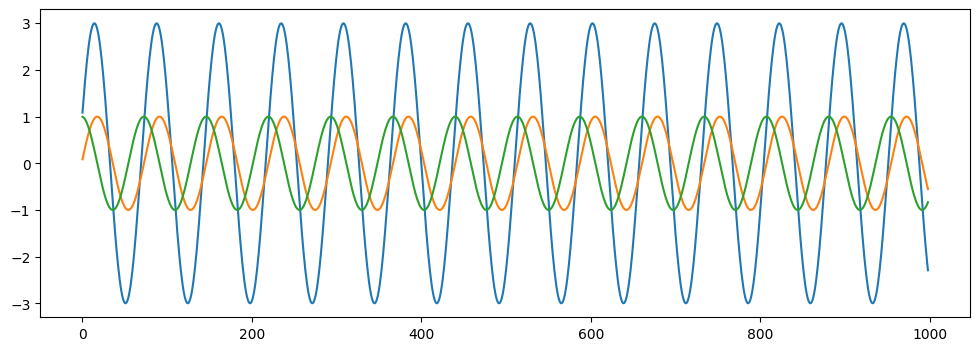

In [30]:
def dot_amplitude(data1, data2):
    dot_product = np.dot(data1, data2)
    return 2 * (dot_product / len(data1))


rate = 8000
amplitude = 3.0
k = 1000
phase = k * (2 * np.pi / srate)
print('Original amplitude  = %2.2f' % amplitude)
print('Original phase = %2.2f' % phase)

(t,data) = create_sinusoid(freq=300, dur = 0.5, amp =amplitude, phase = phase)
plt.plot(data[1:1000])
(t,basis_sin) = create_sinusoid(freq=300, dur=0.5, amp = 1)
(t,basis_cos) = create_sinusoid(freq=300, dur=0.5, amp = 1, phase = np.pi/2)
plt.plot(basis_sin[1:1000])
plt.plot(basis_cos[1:1000])

# we take to dot-products of our input signal - one with the sin basis function
# and one with the cos basis function. Together these two estimates a and b are used to
# estimate both the amplitude/magnitude and the phase

a = dot_amplitude(data, basis_sin)
b = dot_amplitude(data, basis_cos)
estimated_phase = np.arctan(b/a)
estimated_magnitude = np.sqrt(a*a+b*b)
print('Estimated Magnitude = %2.2f' % estimated_magnitude)
print('Estimated Phase = %2.2f' % estimated_phase)

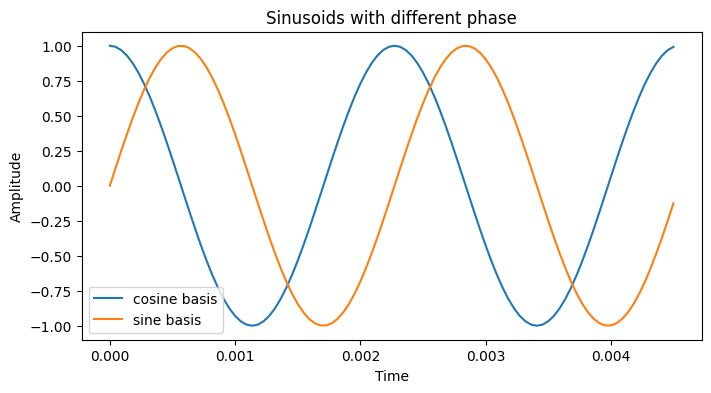

a = 0.046707682880210016
b = 3.0151762461331812
Amp = 3.015537995596444
Angle =  1.5553067024720995


a = 2.5638381040133504
b = 1.6497895523224968
Amp = 3.048781951951178
Angle =  0.5717811136311433


a = 2.880459900728853
b = -0.7942429223618904
Amp = 2.9879543268645903
Angle =  -0.26904918397462924




In [32]:
srate = 22050

(t,data0) = create_sinusoid(freq = 440, dur = 0.02,amp = 1.0, phase = np.pi/2)
(t,data1) = create_sinusoid(freq = 440, dur = 0.02,amp = 1.0, phase = 0)

fig = plt.figure(figsize=(8,4))
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Sinusoids with different phase')
plt.plot(t[0:100], data0[0:100], t[0:100], data1[0:100])
plt.legend(['cosine basis', 'sine basis'])
plt.show()

imaginary = amplitude_estimate(data1, data2)
real = amplitude_estimate(data0, data2)

a = real
b = imaginary
print('a =', a)
print('b =', b)
print('Amp =', np.sqrt(a*a+b*b))
print('Angle = ', np.arctan2(b,a))
print('\n')

a = amplitude_estimate(data1, data3)
b = amplitude_estimate(data0, data3)
print('a =', a)
print('b =', b)
print('Amp =', np.sqrt(a*a+b*b))
print('Angle = ', np.arctan2(b,a))

print('\n')

a = amplitude_estimate(data1, data4)
b = amplitude_estimate(data0, data4)
print('a =', a)
print('b =', b)
print('Amp =', np.sqrt(a*a+b*b))
print('Angle = ', np.arctan2(b,a))

print('\n')



So let's recap. If we are looking for the amplitude of a sinusoidal signal that is part of a complex signal and we know it's frequency we can take use inner-products of array corresponding to the complex signal that contains our "burried" sinusoid with two basis arrays (or probes) one containing a sampled sine signal of the known frequency and one containing a sampled cosine signal of the known frequency.
The resulting estimates which we call "real" and "imaginary" can be combined to return an estimate of the mangitude of the sinusoid as well as an estimate of the phase. Each of these sinusoids can be considered a "probe" or "basis" and is a building block that can take as input a complex input signal consisting of multiple sinusoidal signals and potentially other interferring sounds and estimate reliably the amplitude and the phase of of a sinusoid with a particular frequency of interest.




# Exploring the Discrete Fourier Transform  

### George Tzanetakis, University of Victoria

In this notebook we will explore the Discrete Fourier Transform which is a fundamental algorithm in Digital Signal Processing. First let's look at the mathematical notation:

\begin{equation}
X_k = <x, e^{jtk2\pi /N}> = \sum_{t=0}^{N-1} x_t e^{-j t k 2 \pi/N}  
\end{equation}

We start with a finite, length-N segment of a digital signal $x_0, x_1, \dots, x_{N-1}$. We define the inner product as expected:
\begin{equation}
<x,y> = \sum_{t=0}^{N-1} x_t y_t^*
\end{equation}
and the corresponding basis is N frequency phasors equally spaced in the desired rage from zero to the sampling frequency:
\begin{equation}
{e^{jtk2\pi/N}} = {cos(tk2\pi/N) + j sin(tk2\pi/N})\;\;\; \text{for} \;\; 0 \leq k \leq N-1
\end{equation}

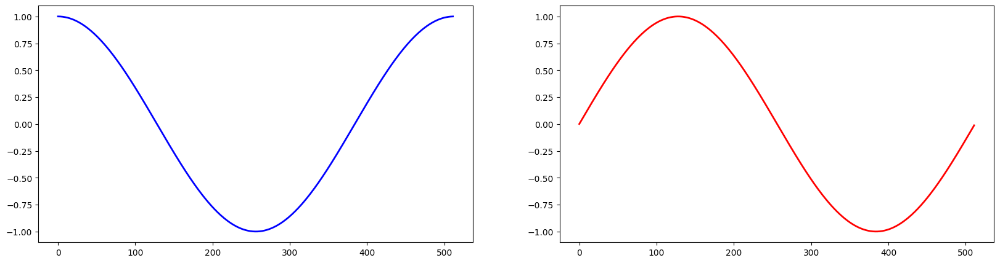

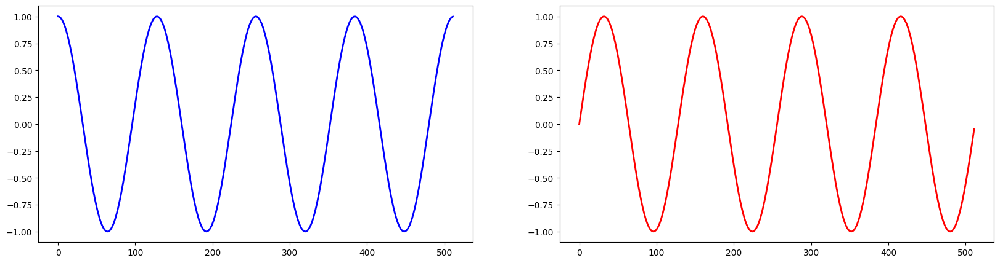

In [31]:
def plot_basis(t, x_re, x_im):
    # plot them
    plt.figure(figsize=(20,5))
    plt.subplot(121)
    plt.plot(t, x_re, lw=2, color='blue')
    plt.subplot(122)
    plt.plot(t, x_im, lw=2, color='red')

N = 512
t = np.arange(0,N)

# basis function real and imaginary parts for k=4
k = 1
x_re = np.cos(k*t*2*np.pi/N)
x_im = np.sin(k*t*2*np.pi/N)
plot_basis(t, x_re, x_im)

k = 4
x_re = np.cos(k*t*2*np.pi/N)
x_im = np.sin(k*t*2*np.pi/N)
plot_basis(t, x_re, x_im)

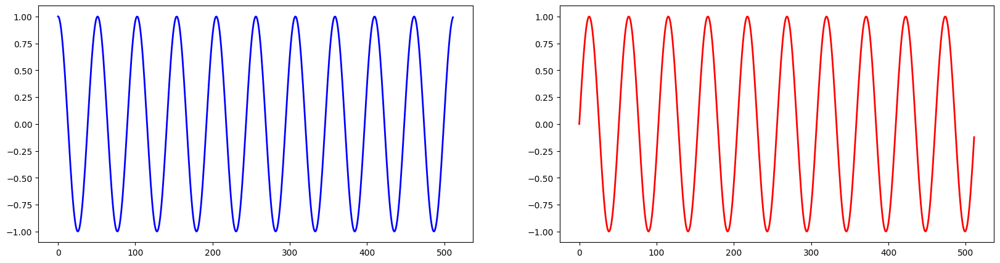

In [32]:
# basis function real and imaginary parts for k=10
k = 10
x_re = np.cos(k*t*2*np.pi/N)
x_im = np.sin(k*t*2*np.pi/N)

plot_basis(t, x_re, x_im)

\begin{equation}
X_k = <x, e^{jtk2\pi /N}> = \sum_{t=0}^{N-1} x_t e^{-j t k 2 \pi/N}  = \sum_{t=0}^{N-1} x_t cos(tk2\pi/N) + \sum_{t=0}^{N-1} x_t  j sin(tk2\pi/N)
\end{equation}

Looking at the equation above you can see that for a specific k the complex spectrum value X_k can be computed by taking two inner products for the input signal $x_t$ with the real and imaginary parts of the corresponding basis function.

Let's consider as input a cosine signal of the same frequency as a particular pair of basis functions let's say with $k=4$ and look at the signal resulting from the point-wise multiplication of the input with the real part and the imagine part. As you can see the point-wise multiplication with the real part results in a signal that is centered above zero and therefore the inner product is positive (the value is shown with the straight black line in the plot). The point-wise multiplication with the imaginary part results in a signal that is centered at zero and therefore the inner product is zero (the value is shown with the straight black line in the plot). Recall from before when we examined using the inner product with a sinusoid of known frequency to estimate amplitude that the estimated amplitude is simply twice the inner product.

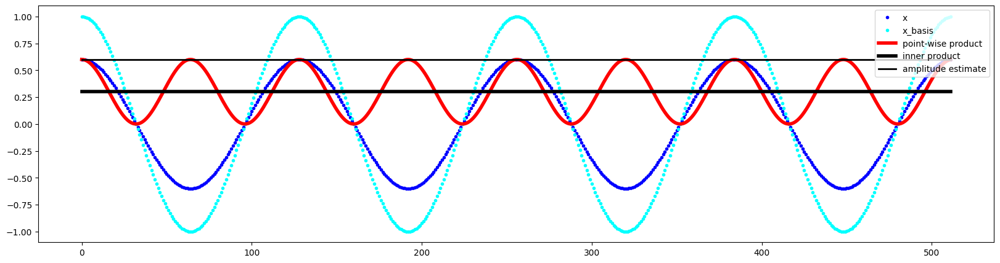

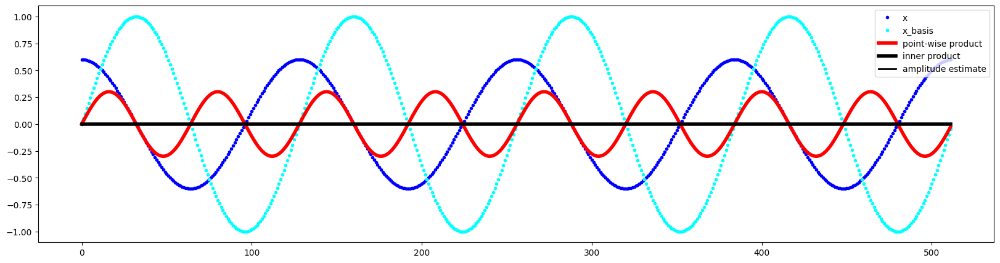

In [33]:
def plot_product(t,x1,x2):
    prod = np.multiply(x1,x2)
    inner_prod = np.sum(prod) / len(prod)
    plt.figure(figsize=(20,5))
    plt.plot(t, x1,'.', lw=1, color='blue')
    plt.plot(t, x2,'.', lw=1, color='cyan')
    plt.plot(t, np.multiply(x1,x2), lw=4, color='red')
    ip_line = np.empty(len(prod))
    ip_line.fill(inner_prod)
    plt.plot(t, ip_line, lw=4, color='black')
    plt.plot(t, ip_line*2, lw=2, color='black')
    plt.legend(('x', 'x_basis', 'point-wise product', 'inner product', 'amplitude estimate'), loc='upper right')


k=4
a = 0.6
x = a * np.cos(k*t*2*np.pi/N)
x_re = np.cos(k*t*2*np.pi/N)
x_im = np.sin(k*t*2*np.pi/N)
plot_product(t,x,x_re)
plot_product(t,x,x_im)

When the input is a sine wave the inner product with the real part of the basis is zero and the inner product with the imaginary part of the basis is positive.

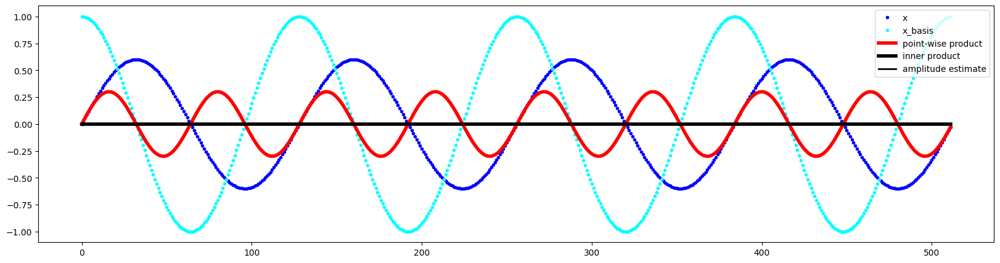

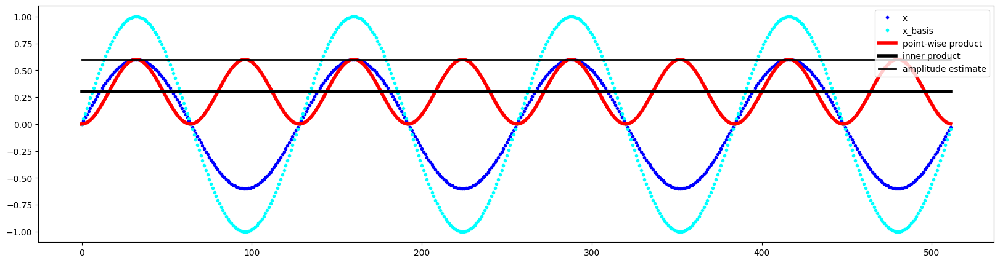

In [34]:

x = a * np.sin(k*t*2*np.pi/N)
plot_product(t,x,x_re)
plot_product(t,x,x_im)


Now let's consider the case of using as input a sinusoidal signal of different frequency let's say corresponding to k=10. As you can observe in this case the inner products with both the real and imaginary part of the basis functions are zero.

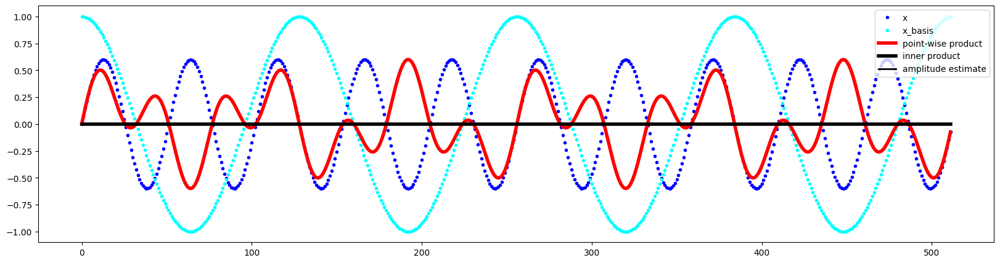

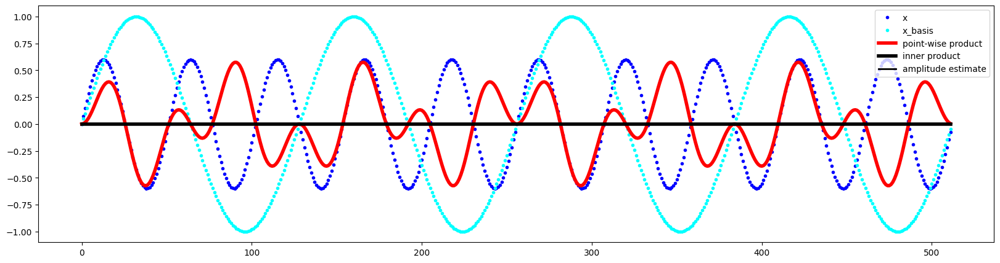

In [35]:
k=10
x = a * np.sin(k*t*2*np.pi/N)
plot_product(t,x,x_re)
plot_product(t,x,x_im)

Now consider an input that is a mixure of two sinsoids. Notice that we are still able to correctly estimate the amplitude of the mixture component that corresponds to the basis function we are using.

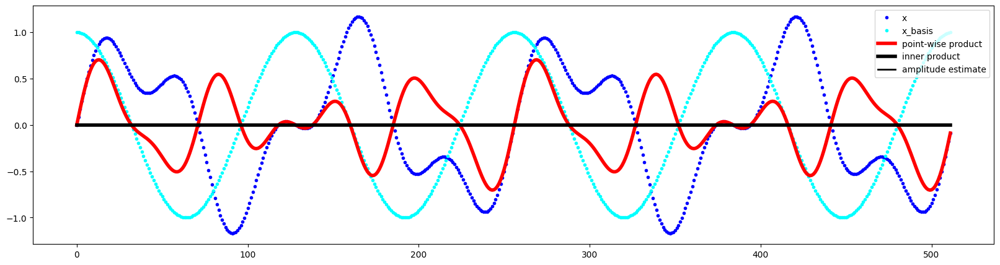

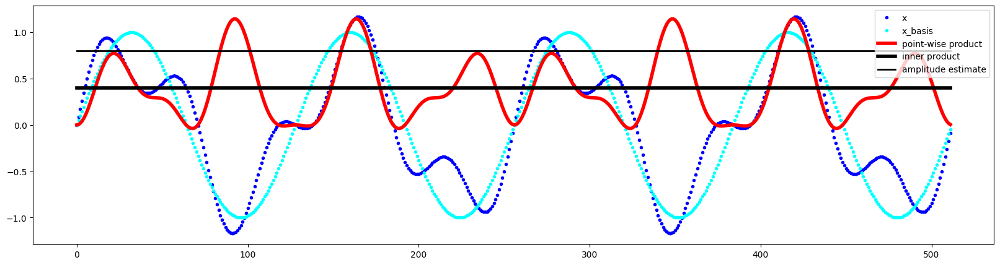

In [36]:
k=4
a1 = 0.8
x1 = a1 * np.sin(k*t*2*np.pi/N)
a2 = 0.4
k = 10
x2 = a2 * np.sin(k*t*2*np.pi/N)
x = x1+x2
plot_product(t,x,x_re)
plot_product(t,x,x_im)

Finally lets look at computing the Discrete Fourier Transform directly from the equation and viewing the magnitude spectrum for the mixture signal we examined above. The code is written so that the connection to measuring amplitude and phases using inner products with the real and imaginary parts of each basis element is emphasized and the code does not utilize the complex number type. Notice the normalization by 2/N so that the mangitude spectrum shows the estimated amplitudes of the input signal.

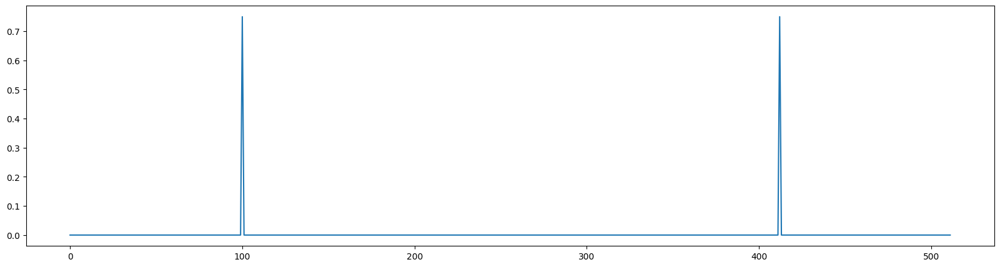

In [37]:
def pedagogical_dft(x, N):
    X_re = np.zeros(N)       # array holding the real parts of the spectrum
    X_im = np.zeros(N)       # array holding the imaginary values of the spectrum
    for k in np.arange(0,N):
        for t in np.arange(0,N):
            X_re[k] += x[t] * np.cos(t * k * 2 * np.pi / N)   # inner product with real basis k
            X_im[k] += x[t] * np.sin(t * k * 2 * np.pi / N)   # inner product with imaginary basis k
    return (X_re, X_im)

def plot_mag_spectrum(Xmag):
    plt.figure(figsize=(20,5))
    n = np.arange(0,len(Xmag))
    plt.plot(n,Xmag)

N = 512
n = np.arange(0,N)

# Single sinusoid
k=100
x1 = 0.75 * np.sin(k*n*2*np.pi/N)

(X_re, X_im) = pedagogical_dft(x1, N)
Xmag = 2 * np.sqrt(X_re * X_re + X_im * X_im) /N
plot_mag_spectrum(Xmag)

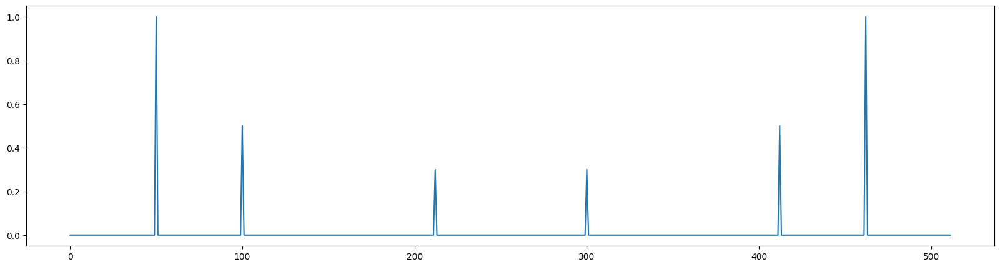

In [38]:
# Mixture sinusoid input
x2 = np.sin(50*n*2*np.pi/N) + 0.5 * np.sin(100 * n * 2 * np.pi/N) + 0.3 * np.sin(300 * n * 2 * np.pi/N)

(X_re, X_im) = pedagogical_dft(x2, N)
Xmag = 2 * np.sqrt(X_re * X_re + X_im * X_im) / N
plot_mag_spectrum(Xmag)


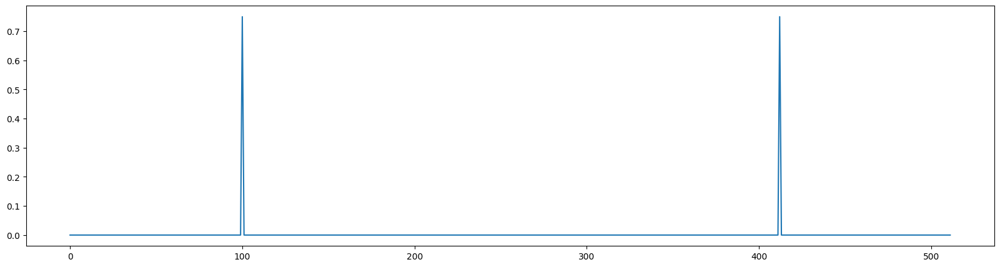

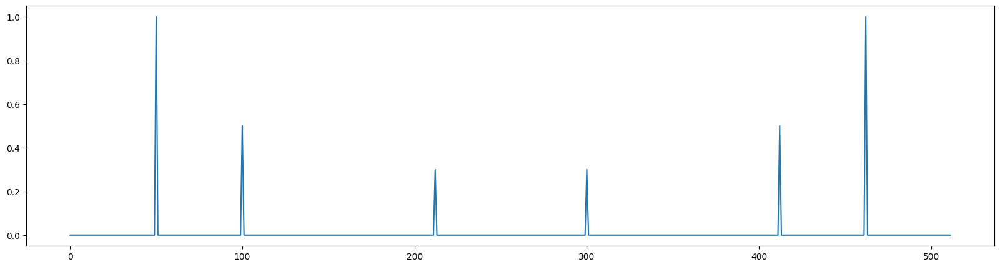

In [39]:
X = np.fft.fft(x1)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag)

X = np.fft.fft(x2)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag)

In [ ]:
%%time
import numpy as np
import timeit


def pedagogical_dft(x, N):
    X_re = np.zeros(N)       # array holding the real parts of the spectrum
    X_im = np.zeros(N)       # array holding the imaginary values of the spectrum
    for k in np.arange(0,N):

        for t in np.arange(0,N):
            X_re[k] += x[t] * np.cos(t * k * 2 * np.pi / N)   # inner product with real basis k
            X_im[k] += x[t] * np.sin(t * k * 2 * np.pi / N)   # inner product with imaginary basis k
    return (X_re, X_im)

def test():
    x = np.zeros(512)
    for i in range(10):
      pedagogical_dft(x,512)

test()

CPU times: user 23.9 s, sys: 26.5 ms, total: 24 s
Wall time: 24.1 s


In [ ]:
%%time
import numpy as np
import timeit

def test():
    for i in range(10):
      x = np.zeros(512)
      np.fft.fft(x)

test()

CPU times: user 240 µs, sys: 992 µs, total: 1.23 ms
Wall time: 1.06 ms


33076


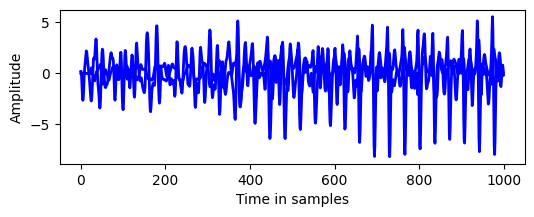

In [ ]:
import scipy.fft as fft
import random

y = trumpet[0:100000]
#y = fishin[0:10000]
complex_spectrum = fft.rfft(y)

magnitude_spectrum = np.abs(complex_spectrum)
print(len(complex_spectrum))
bin = 10

#mags = magnitude_spectrum[bin:bin+10000]
#magnitude_spectrum = np.zeros(len(magnitude_spectrum))
#magnitude_spectrum[bin:bin+10000] = mags

#magnitude_spectrum = np.roll(np.abs(complex_spectrum), -1000)
#magnitude_spectrum = np.ones(len(magnitude_spectrum))
magnitude_spectrum = np.abs(complex_spectrum)
phase_spectrum = np.angle(complex_spectrum)
phase_spectrum[0:int(len(magnitude_spectrum))] = np.random.uniform(0, 2*np.pi, int(len(magnitude_spectrum)))

reconstructed_complex_spectrum  = magnitude_spectrum*(np.cos(phase_spectrum)+1j*np.sin(phase_spectrum))
reconstructed = fft.irfft(reconstructed_complex_spectrum)
fig = plt.figure(figsize=(6,2))
plt.xlabel("Time in samples")
plt.ylabel("Amplitude")
plt.plot(reconstructed[0:1000], lw=2, color='blue')
plt.plot(y[0:1000], lw=2, color='blue')

plt.show()
ipd.Audio( reconstructed,rate=sr, normalize=True)



In [ ]:
a = np.concatenate([reconstructed, reconstructed, reconstructed], axis=0)
print(a.shape)

(198450,)


In [ ]:
ipd.Audio(a,rate=sr, normalize=True)

In [ ]:
import scipy.signal as signal
audio_signal = trumpet
hopSize = 256
winSize = 1024
offsets = np.arange(0, len(audio_signal), hopSize)

output = np.zeros(len(audio_signal))
spectrogram = []
times = []
for (m,o) in enumerate(offsets):
    frame = audio_signal[o:o+winSize]
    if len(frame) < winSize:
            break  # Ignore incomplete segment
    window = signal.windows.hann(len(frame))
    mag_spectrum = np.abs(np.fft.fft(frame)[:winSize // 2])
    spectrogram.append(mag_spectrum)
    frame = window * frame
    output[o:o+winSize] += frame
    times.append((o + winSize) / sr)

spectrogram = np.array(spectrogram).T
frequencies = np.fft.fftfreq(winSize, d=1/sr)[:winSize // 2]

ipd.Audio(output, rate=sr)

In [ ]:
a = [1, 2, 4,5, 6]
print(a[:3])
winSize = 1024
print(winSize /2)
print(winSize // 2)

[1, 2, 4]
512.0
512


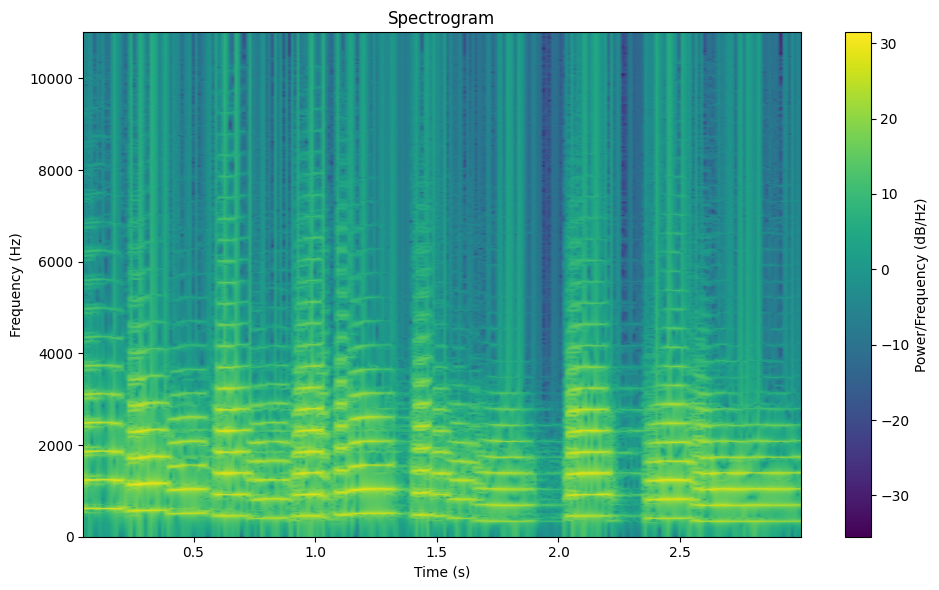

In [ ]:
# Plot the spectrogram
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram + 1e-10), shading='gouraud', cmap='viridis')
#plt.pcolormesh(times, frequencies, spectrogram, shading='gouraud', cmap='viridis')

plt.colorbar(label='Power/Frequency (dB/Hz)')
plt.title('Spectrogram')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.tight_layout()
plt.show()

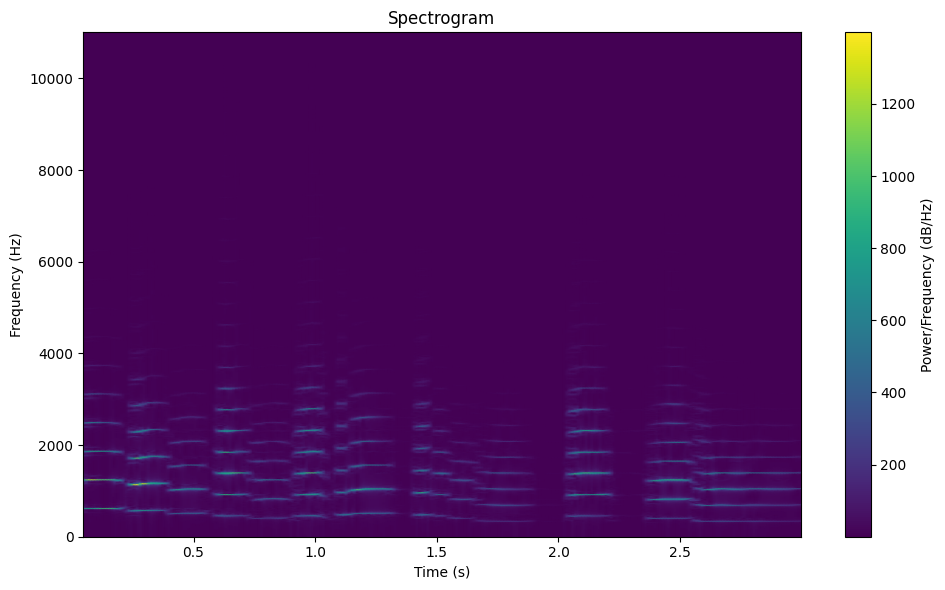

In [ ]:
# Plot the spectrogram
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, spectrogram, shading='gouraud', cmap='viridis')
#plt.pcolormesh(times, frequencies, spectrogram, shading='gouraud', cmap='viridis')

plt.colorbar(label='Power/Frequency (dB/Hz)')
plt.title('Spectrogram')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.tight_layout()
plt.show()

In [ ]:
import scipy.signal as signal
audio_signal = trumpet
hopSize = 1 * 512
winSize = 1 * 4096
offsets = np.arange(0, len(audio_signal), hopSize)

output = np.zeros(len(audio_signal))
spectrogram = []
times = []
for (m,o) in enumerate(offsets):
    frame = audio_signal[o:o+winSize]
    if len(frame) < winSize:
            break  # Ignore incomplete segment
    window = signal.windows.hann(len(frame))
    windows = np.ones(len(frame))
    #mag_spectrum = np.abs(np.fft.fft(frame)[:winSize // 2])
    #spectrogram.append(mag_spectrum
    complex_spectrum = np.fft.fft(window*frame)
    mag_spectrum = np.abs(complex_spectrum)
    sorted_mag_spectrum = np.sort(mag_spectrum)
    threshold = sorted_mag_spectrum[-4]
    mag_spectrum[mag_spectrum < threshold] = 0
    #spectrogram.append(mag_spectrum)
    #mag_spectrum = np.ones(len(frame))
    phase_spectrum = np.angle(complex_spectrum)
    phase_spectrum[0:int(len(mag_spectrum))] = np.random.uniform(0, 2*np.pi, int(len(mag_spectrum)))
    #phase_spectrum = np.zeros(len(mag_spectrum))

    reconstructed_complex_spectrum  = mag_spectrum*(np.cos(phase_spectrum)+1j*np.sin(phase_spectrum))
    reconstructed_frame = np.real(fft.ifft(reconstructed_complex_spectrum))

    reconstructed = window * reconstructed_frame
    output[o:o+winSize] += reconstructed_frame
    times.append((o + winSize) / sr)

spectrogram = np.array(spectrogram).T
frequencies = np.fft.fftfreq(winSize, d=1/sr)[:winSize // 2]
ipd.Audio(output, rate=sr)

In [ ]:
import soundfile as sf
def plot_mag_spectrum(Xmag):
    plt.figure(figsize=(20,5))
    n = np.arange(0,len(Xmag))
    plt.plot(n,Xmag)

# load a C4 sine wave
x,srate = sf.read('sineC4.wav')
print(np.max(x))
ipd.Audio(x,rate=srate)

LibsndfileError: Error opening 'sineC4.wav': System error.

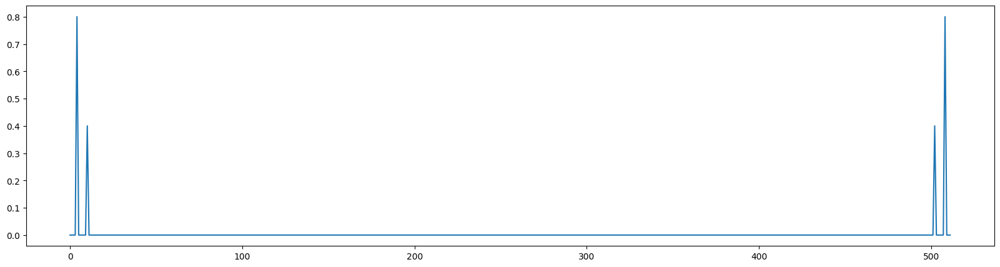

In [ ]:
N = len(x)
X = np.fft.fft(x)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag)

In [ ]:
# load a C4 sine wave - notice that there are multiple peaks
# corresponding to the harmonics
x,srate = sf.read('cl_C4.wav')
print(np.max(x))
ipd.Audio(x,rate=srate)
ipd.Audio(x,rate=srate)

In [ ]:
N = len(x)
X = np.fft.fft(x)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag)

In [ ]:
# let's zoom to the first 5000 values to see the harmonics better
plot_mag_spectrum(Xmag[1:5000])

In [ ]:
# load a 3 second excerpt from a jazz recording
x, srate = sf.read('freddie3sec.wav')
ipd.Audio(x,rate=srate)

In [ ]:
N = len(x)
X = np.fft.fft(x)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag)
plot_mag_spectrum(Xmag[1:5000])

In [ ]:
def plot_mag_spectrum(Xmag, N):
    plt.figure(figsize=(20,5))
    n = np.arange(0,len(Xmag))
    plt.xlabel('Frequency as DFT bin')
    plt.plot(n,Xmag)

    plt.figure(figsize=(20,5))
    n = np.linspace(0.0, len(Xmag) *1.0 /N, num=len(Xmag))
    plt.xlabel('Frequency in fractions of sampling rate')
    plt.plot(n,Xmag)

    plt.figure(figsize=(20,5))
    n = np.linspace(0.0, (len(Xmag) *1.0 / N)*44100, num=len(Xmag))
    plt.xlabel('Frequency in Hz ')

    plt.plot(n,Xmag)

# load a C4 sine wave
x, srate = sf.read('freddie3sec.wav')
N = len(x)
X = np.fft.fft(x)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag[1:5000], len(Xmag) )

In [ ]:
# load a C4 sine wave
x, srate = sf.read('sineC4.wav')
N = len(x)
X = np.fft.fft(x)
Xmag = 2 * np.abs(X) / N
plot_mag_spectrum(Xmag[1:1000], N)
Xmag = Xmag[1:1000]

In [ ]:
fractions   = np.linspace(0.0, len(Xmag) *1.0 /N, num=len(Xmag))
frequencies = np.linspace(0.0, (len(Xmag) *1.0 / N)*44100, num=len(Xmag))

# find the index (dft bin) of the peak
peak_bin = np.argmax(Xmag)
print('Index in bins: ', peak_bin)
print('Index in fractions of sampling rate', fractions[peak_bin])
print('Index in Hz: ', frequencies[peak_bin])
peak_freq = frequencies[peak_bin]
peak_midi = int(69 + 12*np.log2(peak_freq/440.))
print(peak_midi)